In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import pickle
import os
import sys
sys.path.insert(0, '..')
from titan.Experiment import Experiment
from titan.plt_Experiment_summary import titan_plt_summary, titan_plt_summary_temp
from titan.load_and_preprocessing import titan_load_and_preprocessing
import sigmoid_fitting as sp
from titan.processing_DNA import titan_plt_infl
from scipy.ndimage import convolve1d
from sklearn.manifold import TSNE
from joblib import Parallel, delayed

%load_ext autoreload
%autoreload
sys.path.insert(0, '0_4_AMCA Code on Chip')
import chip_utilities as utils

# Playground (Testing)

In [8]:
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_path = Path(exp_folder, "D20250808_E00_C00_F4500KHz_U_Sample_7")
file_path = f"{exp_path}/normalised_ori_ac_df.csv"
curve_data = utils.denormalized(pd.read_csv(file_path))
# curve_filepaths = [f"{exp_path}/normalised_raw_data_l_df.csv", f"{exp_path}/normalised_raw_data_nl_df.csv", f"{exp_path}/normalised_ori_ac_df.csv", f"{exp_path}/normalised_moving_avg_df.csv", f"{exp_path}/normalised_sigmoid_5p_df.csv"]
# curve_names = ["raw_data_l", "raw_data_nl", "ori_ac", "moving_avg", "sigmoid_5p"]
# curve_dfs = []

# for cf in curve_filepaths:
#     curve_dfs.append(utils.denormalized(pd.read_csv(cf)))

/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:48: RuntimeWarning: divide by zero encountered in log
  log_div = np.log((tau_i - C) / A) / np.log((tau_f - C) / A)  # Intermediate operation
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:48: RuntimeWarning: invalid value encountered in divide
  log_div = np.log((tau_i - C) / A) / np.log((tau_f - C) / A)  # Intermediate operation
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/linearise.py:49: RuntimeWarning: divide by zero encountered in divide
  D = (V_i - (log_div * V_f)) / (1 - log_div)  # Calculate D
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-mai

DEBUG START_SETTLED_END: idxstart 15, idxsettled 34, idxend 649
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7 saved.


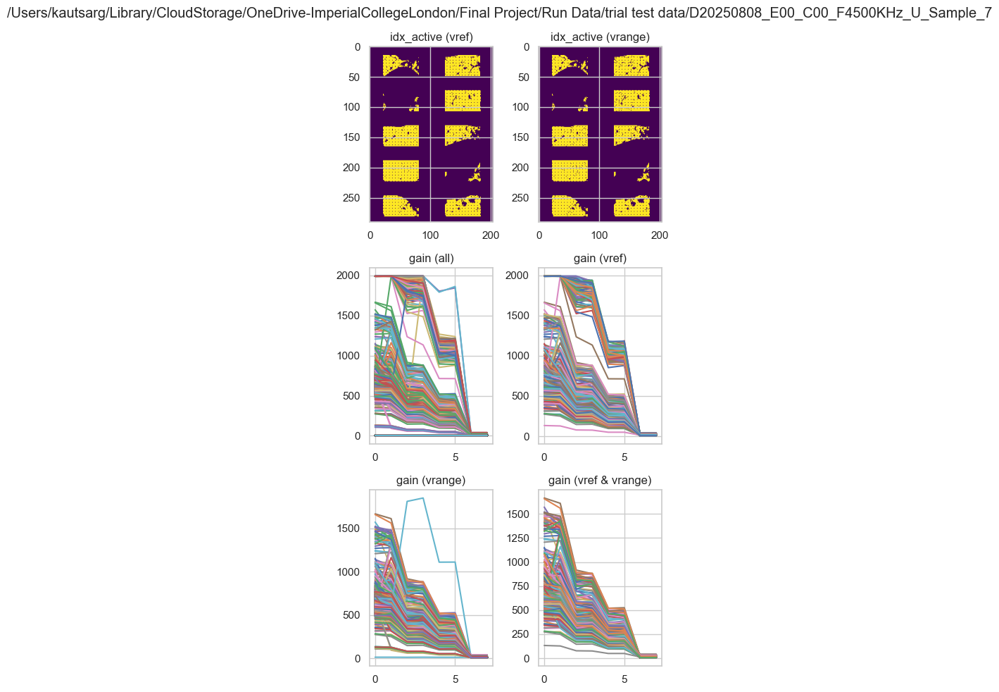

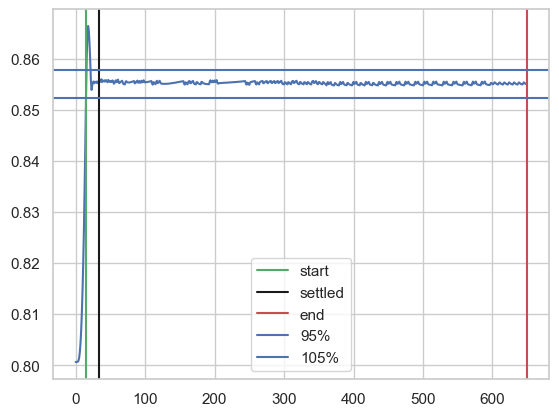

In [9]:
n_wells = 10
n_a_type = "v04"
exp = titan_load_and_preprocessing(exp_path, n_wells=n_wells, start_type="temperature",
                                            end_time_min=60, n_a_type=n_a_type,
                                            print_status=False, plt_gain_calib=False, save_gain_calib=False)

In [10]:
idx_start = exp.wells_list[0].idx_start
idx_settled = exp.wells_list[0].idx_settled
idx_end = exp.wells_list[0].idx_end
idx_active = exp.wells_list[0].idx_active
time_npr = exp.wells_list[0].time_npr
well_nrows = exp.wells_list[0].well_nrows
well_ncols = exp.wells_list[0].well_ncols
well_temp_nrows = exp.wells_list[0].well_temp_nrows
well_temp_ncols = exp.wells_list[0].well_temp_ncols
well_nrows, well_ncols, well_temp_nrows, well_temp_ncols

y, x = np.indices((well_nrows, well_ncols))
temp_group_idx = ((y // 5) * well_temp_ncols + (x // 5)).flatten()
temp_group_active = temp_group_idx[idx_active]

well_3d_temp_npr = exp.wells_list[0].well_3d_temp_npr
well_2d_temp_npr = exp.wells_list[0].well_2d_temp_npr
well_temp_2D_NEW = exp.wells_list[0].well_temp_2D_NEW
well_temp_lin2d  = exp.wells_list[0].well_temp_lin2d
well_temp_mean_then_lin = exp.wells_list[0].well_temp_mean_then_lin

well_3d_lin = exp.wells_list[0].well_3d_lin
n_time = well_3d_lin.shape[2]
well_2d = well_3d_lin.reshape(-1, n_time, order='C').T
well_2d_sliced = well_2d[idx_settled:idx_end,:]
well_2d_bs = well_2d_sliced - well_2d_sliced[0,:]
well_2d_bs_active = well_2d_bs[:,idx_active]

well_2d_nl = exp.wells_list[0].well_2d_nl
well_2d_nl_sliced = well_2d_nl[idx_settled:idx_end, :]
well_2d_nl_bs = well_2d_nl - well_2d_nl_sliced[0, :]  
well_2d_nl_bs_active = well_2d_nl_bs[:, idx_active]
# well_2d_bs_active_sliced = well_2d_bs_active[idx_settled:idx_end,:]


# plt.plot(well_2d_temp_npr)
# plt.show()


/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/Well.py:74: RuntimeWarning: divide by zero encountered in log
  lin = 10 * b * np.log((temp_2d - c) / a)
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/Well.py:74: RuntimeWarning: invalid value encountered in log
  lin = 10 * b * np.log((temp_2d - c) / a)
/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/../titan/Well.py:75: RuntimeWarning: invalid value encountered in subtract
  lin_plt = - (lin - lin[0])


In [11]:
well_2d_temp_npr.shape, well_temp_2D_NEW.shape, well_temp_lin2d.shape, well_temp_mean_then_lin.shape

((650, 252), (650, 252), (650, 252), (650,))

# Temp Grouped Pixels Viz

DEBUG START_SETTLED_END: idxstart 16, idxsettled 36, idxend 754
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250826_E00_C00_F4500KHz_U_Sample_14_rep2 saved.
DEBUG START_SETTLED_END: idxstart 16, idxsettled 43, idxend 683
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250818_E00_C00_F4500KHz_U_Sample_17 saved.
DEBUG START_SETTLED_END: idxstart 16, idxsettled 33, idxend 697
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250815_E00_C00_F4500KHz_U_Sample_11_rep2 saved.
DEBUG START_SETTLED_END: idxstart 15, idxsettled 36, idxend 680
Image start_end_temp.png for experiment /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D2025082

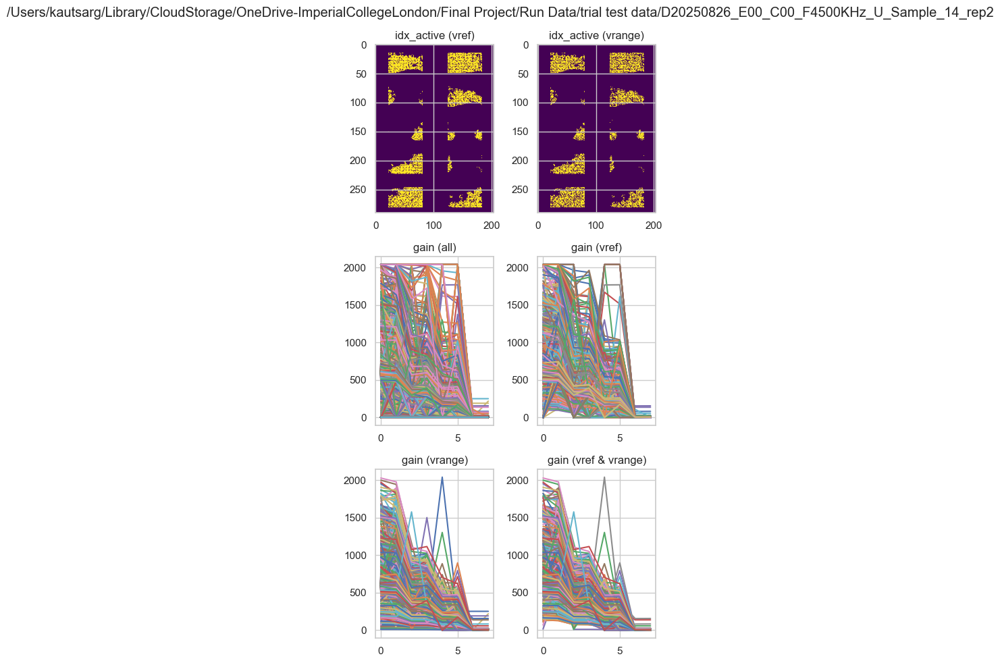

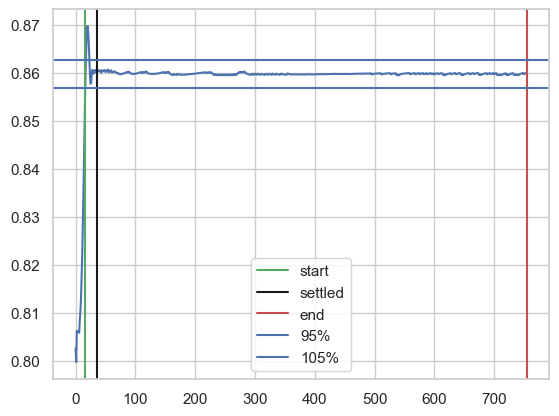

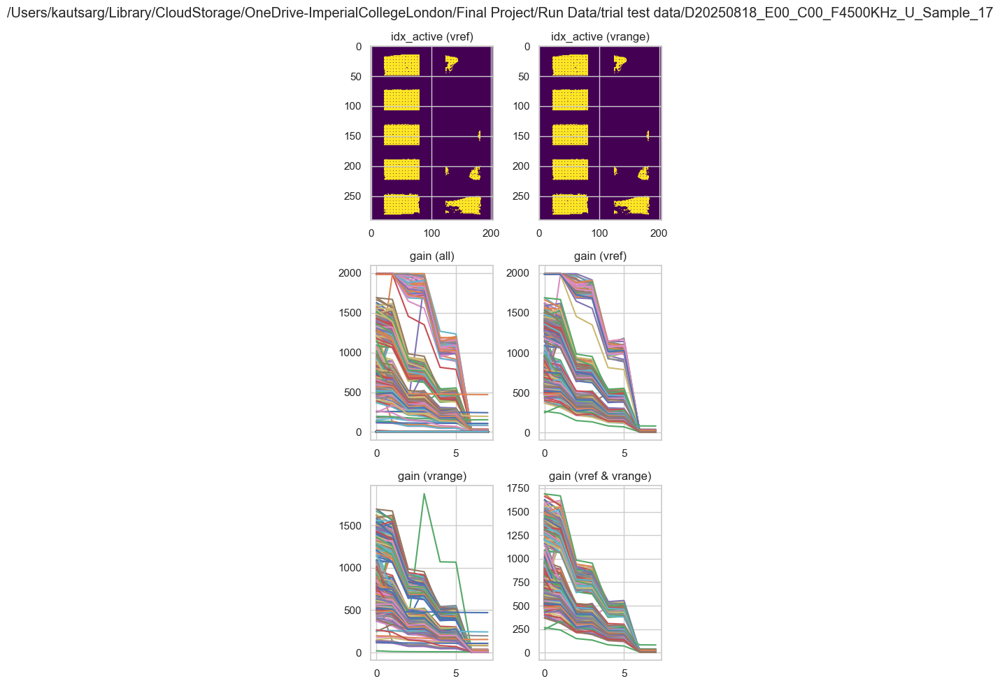

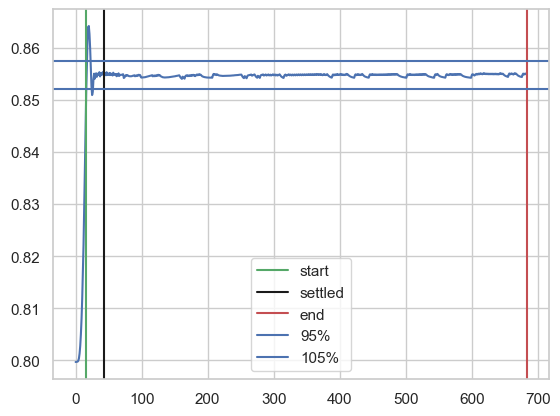

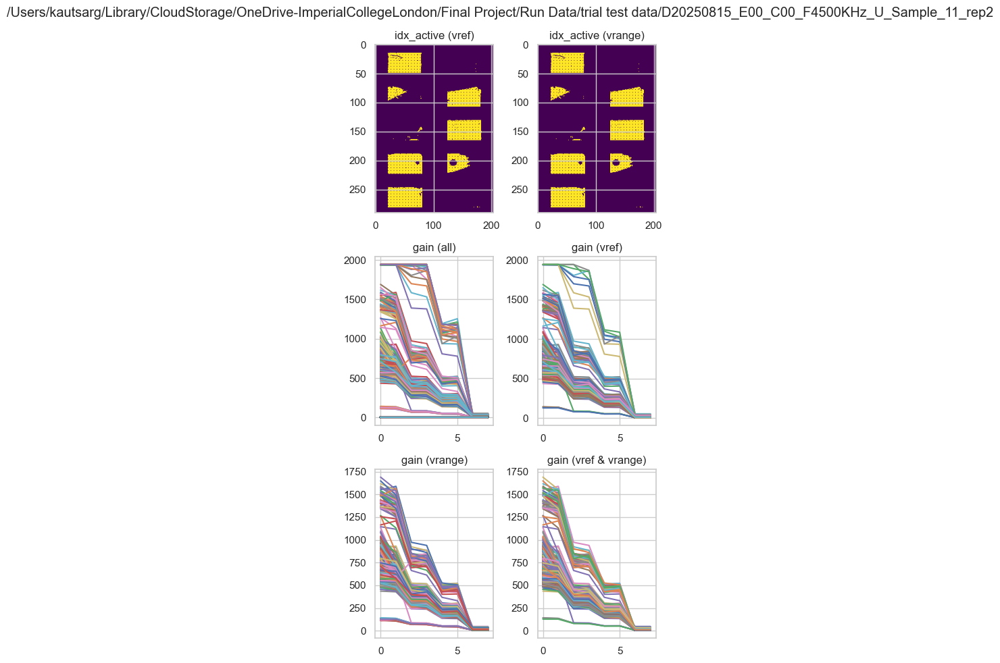

...

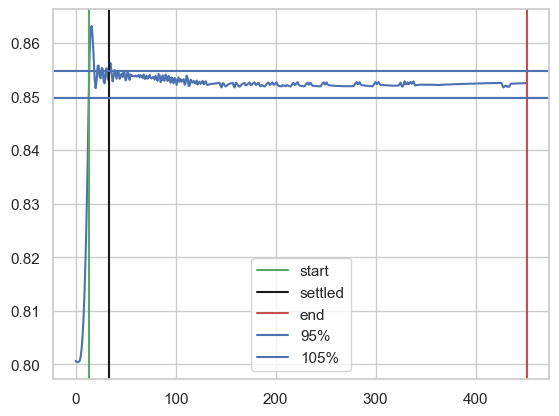

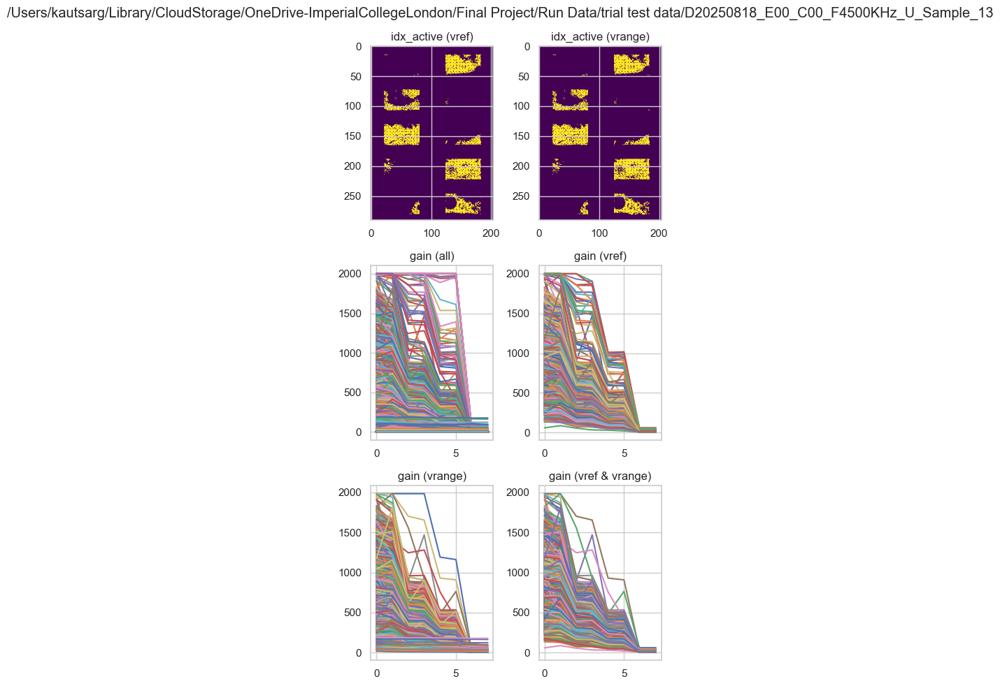

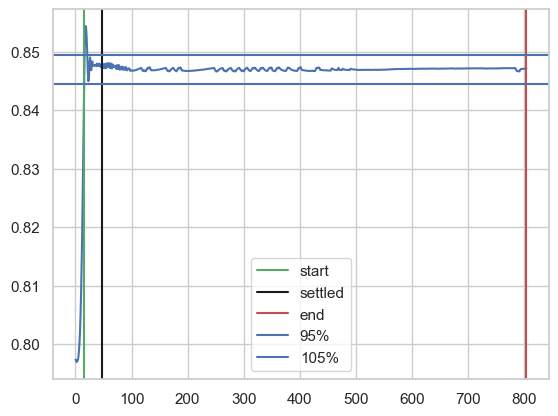

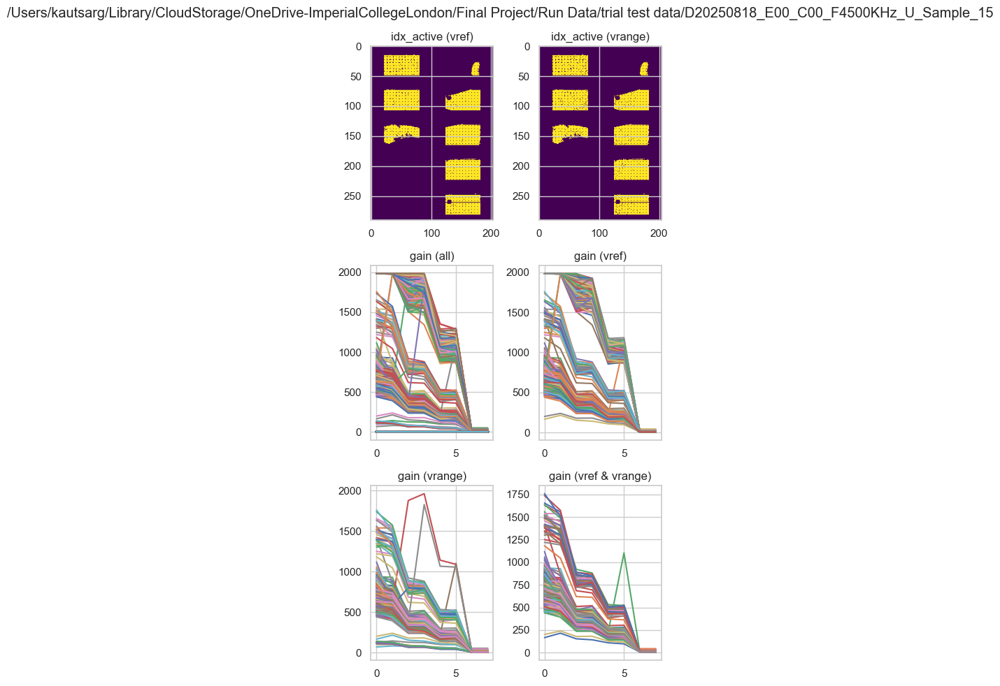

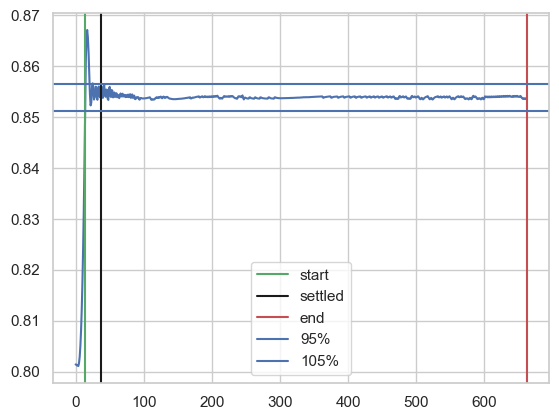

In [ ]:
import os
from pathlib import Path
import numpy as np
from bokeh.plotting import figure, save, output_file, show
from bokeh.layouts import column, row, Spacer
from bokeh.models import ColumnDataSource, CustomJS, Div, HoverTool, Span, CrosshairTool, TapTool

# 1. Output settings
n_wells = 10
n_a_type = "v04"
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_paths = [Path(exp_folder, name) for name in os.listdir(exp_folder) if name != ".DS_Store"]

# Base plot size
p_width = 450
p_height = 225

for i_path, exp_path in enumerate(exp_paths):
    output_file(f"{exp_path}/all_wells_interactive.html", title="All Wells Interaction")
    
    exp = titan_load_and_preprocessing(exp_path, n_wells=n_wells, start_type="temperature",
                                            end_time_min=60, n_a_type=n_a_type,
                                            print_status=False, plt_gain_calib=False, save_gain_calib=False)
    all_well_layouts = []

    for w_idx, well in enumerate(exp.wells_list):
        # --- EXTRACT DATA ---
        idx_settled = well.idx_settled
        idx_end = well.idx_end
        idx_active = well.idx_active
        time_npr = well.time_npr

        well_nrows, well_ncols = well.well_nrows, well.well_ncols
        well_temp_nrows, well_temp_ncols = well.well_temp_nrows, well.well_temp_ncols
        
        well_temp_2D_NEW = well.well_temp_lin2d 
        well_2d_temp_npr = well.well_2d_temp_npr 
        
        # --- NEW: Mean Temperature Data ---
        well_temp_mean_then_lin = well.well_temp_mean_then_lin # 1D array

        y, x = np.indices((well_nrows, well_ncols))
        temp_group_idx = ((y // 5) * well_temp_ncols + (x // 5)).flatten()

        # Pixel data (Linearised)
        well_3d_lin = well.well_3d_lin
        n_time = well_3d_lin.shape[2]
        well_2d = well_3d_lin.reshape(-1, n_time, order='C').T
        well_2d_bs = well_2d - well_2d[idx_settled, :]  
        well_2d_bs_active = well_2d_bs[:, idx_active]

        # Pixel data (Non-Linearised)
        well_3d_npr = well.well_3d_npr
        well_2d_nl = well_3d_npr.reshape(-1, n_time, order='C').T
        well_2d_nl_bs = well_2d_nl - well_2d_nl[idx_settled, :]  
        well_2d_nl_bs_active = well_2d_nl_bs[:, idx_active]
        
        n_active_pixels = well_2d_bs_active.shape[1]
        n_temp_groups = well_temp_2D_NEW.shape[1] 
        active_temp_mapping = temp_group_idx[idx_active]
        active_temp_groups = np.unique(active_temp_mapping)
        inactive_temp_groups = np.setdiff1d(np.arange(n_temp_groups), active_temp_groups)

        # --- 1. DATA SOURCES ---
        source_pixels = ColumnDataSource({
            'xs': [time_npr for _ in range(n_active_pixels)],
            'ys_lin': [well_2d_bs_active[:, i] for i in range(n_active_pixels)],
            'ys_nl': [well_2d_nl_bs_active[:, i] for i in range(n_active_pixels)],
            'group_id': active_temp_mapping, 
            'pixel_id': np.where(idx_active)[0] 
        })

        source_temps_active = ColumnDataSource({
            'xs': [time_npr for _ in active_temp_groups],
            'ys_lin': [well_temp_2D_NEW[:, i] for i in active_temp_groups],
            'ys_nl': [well_2d_temp_npr[:, i] for i in active_temp_groups],
            'group_id': active_temp_groups 
        })
        
        source_temps_inactive = ColumnDataSource({
            'xs': [time_npr for _ in inactive_temp_groups],
            'ys_lin': [well_temp_2D_NEW[:, i] for i in inactive_temp_groups],
            'ys_nl': [well_2d_temp_npr[:, i] for i in inactive_temp_groups],
            'group_id': inactive_temp_groups 
        })

        # --- NEW: Source for the Mean Line ---
        source_mean = ColumnDataSource({
            'x': time_npr,
            'y': well_temp_mean_then_lin
        })

        # --- 2. INFORMATION DISPLAY DIV ---
        info_div = Div(text=f"<h3 style='color: grey;'>Well {w_idx}: Select a line to see indices here...</h3>", width=1400)

        # (JS Callbacks remain unchanged)
        cb_pixel_to_temp = CustomJS(args=dict(sp=source_pixels, st=source_temps_active, div=info_div), code="""
            const selected_pixels = sp.selected.indices;
            if (selected_pixels.length === 0) {
                st.selected.indices = [];
                div.text = "<h3 style='color: grey;'>Select a line to see indices here...</h3>";
                return;
            }
            const target_group_id = sp.data['group_id'][selected_pixels[0]];
            const temp_groups = st.data['group_id'];
            const temp_to_select = [];
            for (let i = 0; i < temp_groups.length; i++) {
                if (temp_groups[i] === target_group_id) {
                    temp_to_select.push(i);
                    break; 
                }
            }
            st.selected.indices = temp_to_select;
            const pixel_groups = sp.data['group_id'];
            const mapped_pixel_ids = []; 
            for (let i = 0; i < pixel_groups.length; i++) {
                if (pixel_groups[i] === target_group_id) { mapped_pixel_ids.push(sp.data['pixel_id'][i]); }
            }
            div.text = `<h3 style='color: navy;'>Pixel: <b>${sp.data['pixel_id'][selected_pixels[0]]}</b> | Group: <b>${target_group_id}</b> | All Pixels: <b>${mapped_pixel_ids.join(', ')}</b></h3>`;
        """)

        cb_temp_to_pixel = CustomJS(args=dict(sp=source_pixels, st=source_temps_active, div=info_div), code="""
            const selected_temps = st.selected.indices;
            if (selected_temps.length === 0) {
                sp.selected.indices = [];
                div.text = "<h3 style='color: grey;'>Select a line to see indices here...</h3>";
                return;
            }
            const target_group_id = st.data['group_id'][selected_temps[0]];
            const pixel_groups = sp.data['group_id'];
            const pixels_to_select = [];
            const mapped_pixel_ids = []; 
            for (let i = 0; i < pixel_groups.length; i++) {
                if (pixel_groups[i] === target_group_id) {
                    pixels_to_select.push(i);
                    mapped_pixel_ids.push(sp.data['pixel_id'][i]);
                }
            }
            sp.selected.indices = pixels_to_select;
            div.text = `<h3 style='color: darkorange;'>Selected Temp Group: <b>${target_group_id}</b> | Mapped Pixels: <b>${mapped_pixel_ids.join(', ')}</b></h3>`;
        """)

        source_pixels.selected.js_on_change('indices', cb_pixel_to_temp)
        source_temps_active.selected.js_on_change('indices', cb_temp_to_pixel)

        # --- 3. PLOTTING ---
        hover_pixel_nl = HoverTool(tooltips=[("Pixel", "@pixel_id"), ("Group", "@group_id"), ("Value", "$y")], line_policy="nearest")
        hover_pixel_lin = HoverTool(tooltips=[("Pixel", "@pixel_id"), ("Group", "@group_id"), ("Value", "$y")], line_policy="nearest")
        linked_crosshair = CrosshairTool(dimensions="height", line_color="black", line_alpha=0.3)

        p0 = figure(title=f"NL Pixels (Well {w_idx})", width=p_width, height=p_height, tools=["pan", "wheel_zoom", "box_zoom", "reset", "tap", hover_pixel_nl, linked_crosshair])
        p0.multi_line(xs='xs', ys='ys_nl', source=source_pixels, color="purple", alpha=0.15, selection_color="red")

        p1 = figure(title=f"Lin Pixels (Well {w_idx})", width=p_width, height=p_height, tools=["pan", "wheel_zoom", "box_zoom", "reset", "tap", hover_pixel_lin, linked_crosshair])
        p1.x_range = p0.x_range 
        p1.multi_line(xs='xs', ys='ys_lin', source=source_pixels, color="navy", alpha=0.15, selection_color="red")

        p2 = figure(title=f"NL Temps (Well {w_idx})", width=p_width, height=p_height, tools=["pan", "wheel_zoom", "box_zoom", "reset", linked_crosshair])
        p2.x_range = p0.x_range 
        p2.multi_line(xs='xs', ys='ys_nl', source=source_temps_inactive, color="lightgrey", alpha=0.3)
        active_temp_renderer_nl = p2.multi_line(xs='xs', ys='ys_nl', source=source_temps_active, color="darkorange", alpha=0.15, selection_color="red")
        p2.add_tools(HoverTool(tooltips=[("Group", "@group_id"), ("Val", "$y")], renderers=[active_temp_renderer_nl]), TapTool(renderers=[active_temp_renderer_nl]))

        p3 = figure(title=f"Lin Temps (Well {w_idx})", width=p_width, height=p_height, tools=["pan", "wheel_zoom", "box_zoom", "reset", linked_crosshair])
        p3.x_range = p0.x_range 
        p3.multi_line(xs='xs', ys='ys_lin', source=source_temps_inactive, color="lightgrey", alpha=0.3)
        active_temp_renderer_lin = p3.multi_line(xs='xs', ys='ys_lin', source=source_temps_active, color="darkorange", alpha=0.15, selection_color="red")
    
        p3.line(x='x', y='y', source=source_mean, color="black", line_width=1.5)
        p3.add_tools(HoverTool(tooltips=[("Group", "@group_id"), ("Val", "$y")], renderers=[active_temp_renderer_lin]), TapTool(renderers=[active_temp_renderer_lin]))

        # Spans and final layout
        time_settled_val, time_end_val = time_npr[idx_settled], time_npr[idx_end]
        for p in [p0, p1, p2, p3]:
            p.add_layout(Span(location=time_settled_val, dimension='height', line_color='green', line_dash='dashed'))
            p.add_layout(Span(location=time_end_val, dimension='height', line_color='red', line_dash='dashed'))

        well_layout = column(info_div, row(p0, p1, p2, p3), Spacer(height=50))
        all_well_layouts.append(well_layout)

    master_layout = column(*all_well_layouts)
    save(master_layout) 
    show(master_layout)

# Sigmoid Clean Up

## Non Interactive

In [3]:
# def first_pos_zero_crossing(data):
#     arr = np.asanyarray(data)
#     crossings = np.where((arr[1:] >= 0) & (arr[:-1] < 0))[0]
    
#     if crossings.size > 0:
#         return crossings[0] + 1
    
#     return None # No crossing found

# def lowest_integral_zero_crossing(data):
#     arr = np.asanyarray(data)
#     sign_change = np.where(np.diff(np.sign(arr)) != 0)[0]
#     boundaries = [0] + (sign_change + 1).tolist() + [len(arr)]
    
#     lowest_sum = 0
#     best_crossing_idx = None
    
#     for start, end in zip(boundaries[:-1], boundaries[1:]):
#         segment = arr[start:end]
#         segment_sum = np.sum(segment)
        
#         if segment_sum < lowest_sum:
#             lowest_sum = segment_sum
#             best_crossing_idx = start
            
#     return best_crossing_idx

# def moving_average(X, window_size=10):
#     mask = np.ones(window_size) / window_size
#     # X_avg = convolve1d(X, mask, mode='constant')
#     X_avg = convolve1d(X, mask, mode='nearest')
#     return X_avg

# def _process_single_dydx(x, y):
#     return sp.calculate_first_derivative(x, y)

# def get_curve_timestamps(df):
#     return np.array([col.replace("Cycle", "") for col in df.filter(like='Cycle').columns])

# window_size_ori = 50
# window_size_1stder = 200
# margin = (window_size_1stder - 1) // 2

# ################################################################################
# # 1. Original Curves
# ################################################################################
# ori_curves = curve_data.filter(like="Cycle").values
# ori_well = curve_data.well.values
# ori_timestamps = get_curve_timestamps(curve_data)

# ################################################################################
# # 2. Original Curves Moving Average
# ################################################################################
# ori_curves_avg = Parallel(n_jobs=-1)(
#     delayed(moving_average)(y, window_size_ori) for y in ori_curves
# )
# ori_curves_avg = np.array(ori_curves_avg)

# ################################################################################
# # 3.a. Original Curves Moving Average 1st Derivative
# ################################################################################
# ori_curve_dydx = Parallel(n_jobs=-1)(
#     delayed(_process_single_dydx)(ori_timestamps, y) for y in ori_curves
# )
# ori_curve_dydx = np.array(ori_curve_dydx)

# ################################################################################
# # 3.b. Original Curves Moving Average 1st Derivative
# ################################################################################
# ori_avg_dydx = Parallel(n_jobs=-1)(
#     delayed(_process_single_dydx)(ori_timestamps, y) for y in ori_curves_avg
# )
# ori_avg_dydx = np.array(ori_avg_dydx)

# ################################################################################
# # 4.a. Original Curves 1st Derivative Moving Average
# ################################################################################
# ori_dydx_avg = Parallel(n_jobs=-1)(
#     delayed(moving_average)(y, window_size_1stder) for y in ori_curve_dydx
# )
# ori_dydx_avg = np.array(ori_dydx_avg)

# ################################################################################
# # 4.b. Original Curves Moving Average 1st Derivative Moving Average
# ################################################################################
# ori_avg_dydx_avg = Parallel(n_jobs=-1)(
#     delayed(moving_average)(y, window_size_1stder) for y in ori_avg_dydx
# )
# ori_avg_dydx_avg = np.array(ori_avg_dydx_avg)

# ################################################################################
# # 5.a.1. Cleaned Curve 
# ################################################################################
# ori_curves_cleaned_list = []
# cleaned_idx_list = []
# for i in range(len(ori_curves)):
#     current_curve = ori_curves[i]
#     current_dydx = ori_dydx_avg[i] 

#     cross_idx = first_pos_zero_crossing(current_dydx)

#     if cross_idx is None:
#         cleaned = current_curve.copy()
#         cleaned_idx_list.append(0)
#     else:
#         actual_idx = cross_idx + margin 
#         cleaned_idx_list.append(actual_idx)
#         if actual_idx >= len(current_curve):
#             cleaned = current_curve.copy()
#         else:
#             baseline_val = current_curve[actual_idx]
#             cleaned = np.concatenate([
#                 np.full(actual_idx, baseline_val), 
#                 current_curve[actual_idx:]
#             ])
        
#     ori_curves_cleaned_list.append(cleaned)

# ori_curves_cleaned = np.array(ori_curves_cleaned_list)
# cleaned_idx = np.array(cleaned_idx_list)


# ################################################################################
# # 5.a.2. Cleaned Curve 
# ################################################################################
# ori_curves_cleaned_list = []
# cleaned_idx_list = []
# for i in range(len(ori_curves)):
#     current_curve = ori_curves[i]
#     current_dydx = ori_dydx_avg[i] 

#     cross_idx = lowest_integral_zero_crossing(current_dydx)

#     if cross_idx is None:
#         cleaned = current_curve.copy()
#         cleaned_idx_list.append(0)
#     else:
#         actual_idx = cross_idx + margin 
#         cleaned_idx_list.append(actual_idx)
#         if actual_idx >= len(current_curve):
#             cleaned = current_curve.copy()
#         else:
#             baseline_val = current_curve[actual_idx]
#             cleaned = np.concatenate([
#                 np.full(actual_idx, baseline_val), 
#                 current_curve[actual_idx:]
#             ])
        
#     ori_curves_cleaned_list.append(cleaned)

# ori_curves_cleaned_lowest = np.array(ori_curves_cleaned_list)
# cleaned_lowest_idx = np.array(cleaned_idx_list)


# ################################################################################
# # 5.b.1. Cleaned Curve using Moving Averages
# ################################################################################
# ori_curves_cleaned_list = []
# cleaned_idx_list = []
# for i in range(len(ori_curves)):
#     current_curve = ori_curves[i]
#     current_dydx = ori_avg_dydx_avg[i] 

#     cross_idx = first_pos_zero_crossing(current_dydx)

#     if cross_idx is None:
#         cleaned = current_curve.copy()
#         cleaned_idx_list.append(0)
#     else:
#         actual_idx = cross_idx + margin 
#         cleaned_idx_list.append(actual_idx)
#         if actual_idx >= len(current_curve):
#             cleaned = current_curve.copy()
#         else:
#             baseline_val = current_curve[actual_idx]
#             cleaned = np.concatenate([
#                 np.full(actual_idx, baseline_val), 
#                 current_curve[actual_idx:]
#             ])
        
#     ori_curves_cleaned_list.append(cleaned)

# ori_curves_avg_cleaned = np.array(ori_curves_cleaned_list)
# avg_cleaned_idx = np.array(cleaned_idx_list)

# ################################################################################
# # 5.b.2/ Cleaned Curve using Moving Averages
# ################################################################################
# ori_curves_cleaned_list = []
# cleaned_idx_list = []
# for i in range(len(ori_curves)):
#     current_curve = ori_curves[i]
#     current_dydx = ori_avg_dydx_avg[i] 

#     cross_idx = lowest_integral_zero_crossing(current_dydx)

#     if cross_idx is None:
#         cleaned = current_curve.copy()
#         cleaned_idx_list.append(0)
#     else:
#         actual_idx = cross_idx + margin 
#         cleaned_idx_list.append(actual_idx)
#         if actual_idx >= len(current_curve):
#             cleaned = current_curve.copy()
#         else:
#             baseline_val = current_curve[actual_idx]
#             cleaned = np.concatenate([
#                 np.full(actual_idx, baseline_val), 
#                 current_curve[actual_idx:]
#             ])
        
#     ori_curves_cleaned_list.append(cleaned)

# ori_curves_avg_lowest_cleaned = np.array(ori_curves_cleaned_list)
# avg_cleaned_lowest_idx = np.array(cleaned_idx_list)

In [12]:
def moving_average_vec(data, window_size=10):
    mask = np.ones(window_size) / window_size
    return convolve1d(data, mask, axis=-1, mode='nearest')

def first_pos_zero_crossing_vec(data_2d):
    crossings = (data_2d[:, 1:] >= 0) & (data_2d[:, :-1] < 0)
    indices = np.argmax(crossings, axis=1) + 1
    exists = np.any(crossings, axis=1)
    return np.where(exists, indices, 0)

def lowest_integral_to_next_crossing_vec(data_2d):
    def single_lowest_exit(arr):
        sign_change = np.where(np.diff(np.sign(arr)) != 0)[0]
        boundaries = [0] + (sign_change + 1).tolist() + [len(arr)]
        
        lowest_sum = 0
        best_exit_idx = 0  # Default to 0 if no negative segment found
        
        for start, end in zip(boundaries[:-1], boundaries[1:]):
            segment_sum = np.sum(arr[start:end])
            if segment_sum < lowest_sum:
                lowest_sum = segment_sum
                best_exit_idx = end
                
        return best_exit_idx
    
    return np.array([single_lowest_exit(row) for row in data_2d])

def apply_baseline_cleaning(curves, cross_indices, margin):
    cleaned = curves.copy()
    actual_indices = np.clip(cross_indices + margin, 0, curves.shape[1] - 1)
    
    mask = cross_indices > 0
    
    for i in range(len(curves)):
        if mask[i]:
            idx = actual_indices[i]
            cleaned[i, :idx] = curves[i, idx]
            
    return cleaned, np.where(mask, actual_indices, 0)

In [13]:
window_size_ori = 50
window_size_1stder = 200
margin = (window_size_1stder - 1) // 2

ori_curves = curve_data.filter(like="Cycle").values
ori_timestamps = np.array([col.replace("Cycle", "") for col in curve_data.filter(like='Cycle').columns])
ori_timestamps = ori_timestamps.astype(np.float64)
ori_well = curve_data.well.values

# Smooth curves
ori_curves_avg = moving_average_vec(ori_curves, window_size_ori)

def get_derivatives(curves_batch):
    return Parallel(n_jobs=-1)(
        delayed(sp.calculate_first_derivative)(ori_timestamps, y) for y in curves_batch
    )

# First derivatives
ori_curve_dydx = np.array(get_derivatives(ori_curves))
ori_avg_dydx = np.array(get_derivatives(ori_curves_avg))

# Smooth derivatives
ori_dydx_avg = moving_average_vec(ori_curve_dydx, window_size_1stder)
ori_avg_dydx_avg = moving_average_vec(ori_avg_dydx, window_size_1stder)

# Curves cleaning
cleaning_tasks = [
    ("std", ori_dydx_avg, first_pos_zero_crossing_vec),
    ("low", ori_dydx_avg, lowest_integral_to_next_crossing_vec),
    ("avg_std", ori_avg_dydx_avg, first_pos_zero_crossing_vec),
    ("avg_low", ori_avg_dydx_avg, lowest_integral_to_next_crossing_vec)
]

results = {}
for name, deriv, func in cleaning_tasks:
    indices = func(deriv)
    cleaned_curves, actual_idxs = apply_baseline_cleaning(ori_curves, indices, margin)
    results[name] = (cleaned_curves, actual_idxs)

ori_curves_cleaned, cleaned_idx = results["std"]
ori_curves_cleaned_lowest, cleaned_lowest_idx = results["low"]
ori_curves_avg_cleaned, avg_cleaned_idx = results["avg_std"]
ori_curves_avg_lowest_cleaned, avg_cleaned_lowest_idx = results["avg_low"]

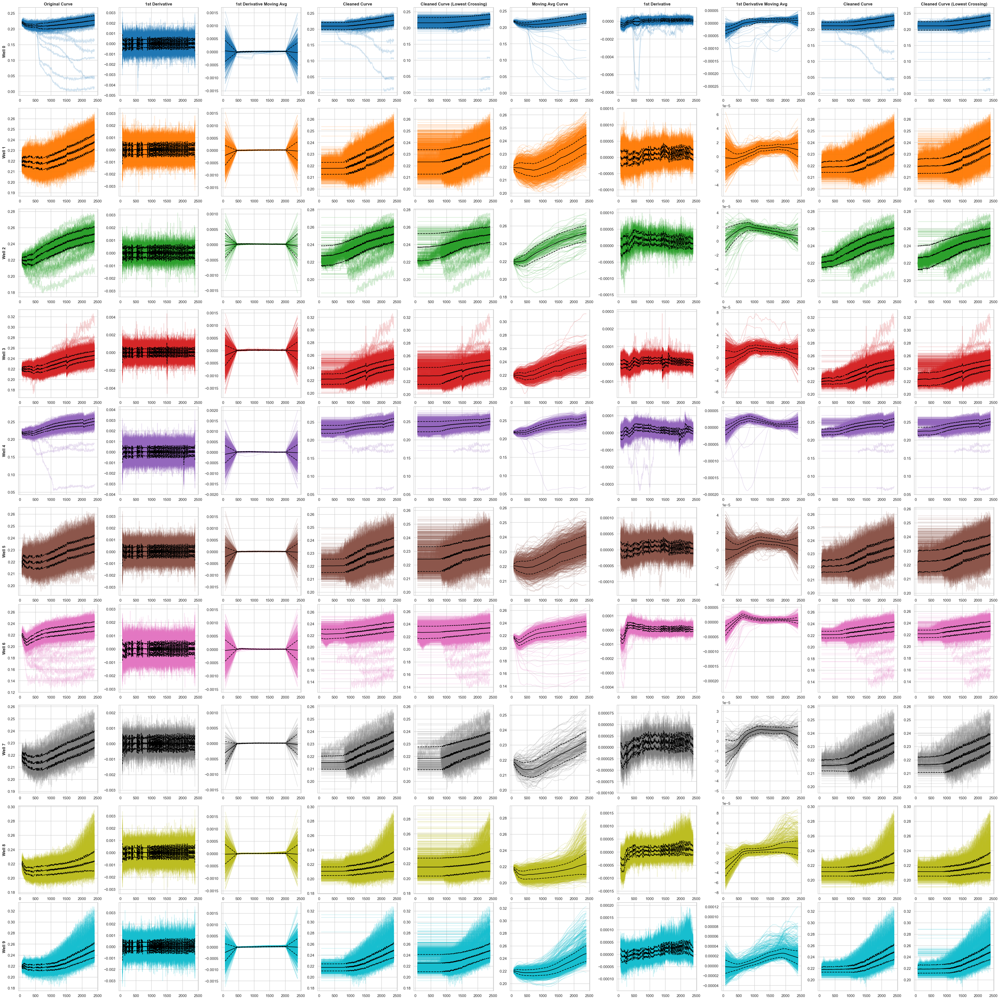

In [6]:
processed_curves = [ori_curves, ori_curve_dydx, ori_dydx_avg, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg, ori_avg_dydx, ori_avg_dydx_avg, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Moving Avg Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)"]

unique_wells = np.unique(ori_well)
num_wells = len(unique_wells)
num_cols = len(processed_curves)
wh_constant = 4

fig, axes = plt.subplots(num_wells, num_cols, 
                         figsize=(wh_constant * num_cols, wh_constant * num_wells),
                         constrained_layout=True)

for col_idx, label in enumerate(curve_labels):
    axes[0, col_idx].set_title(label, fontweight='bold')

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    well_color = plt.cm.tab10(row_idx % 10)
    
    for col_idx, curves in enumerate(processed_curves):
        ax = axes[row_idx, col_idx]
        y_data = curves[mask].T
        y_mean = np.mean(y_data, axis=1)
        y_std = np.std(y_data, axis=1)
        
        ax.plot(ori_timestamps, y_data, color=well_color, alpha=0.2)
        ax.plot(ori_timestamps, y_mean, color="black")
        ax.plot(ori_timestamps, y_mean - y_std, color="black", linestyle='dashed')
        ax.plot(ori_timestamps, y_mean + y_std, color="black", linestyle='dashed')
        
        if col_idx == 0:
            ax.set_ylabel(f"Well {well}", fontweight='bold')

plt.show()

## Interactive

Processing Experiment: /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250826_E00_C00_F4500KHz_U_Sample_14_rep2


FileNotFoundError: [Errno 2] No such file or directory: '/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250826_E00_C00_F4500KHz_U_Sample_14_rep2/normalised_ori_ac_df.csv'

### All in One Plots

In [14]:
import numpy as np
import matplotlib.colors as mcolors
from bokeh.plotting import figure, show, output_file
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource

# 1. Output settings
output_file("interactive_curves.html", title="Interactive Well Curves")

processed_curves = [ori_curves, ori_curve_dydx, ori_dydx_avg, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg, ori_avg_dydx, ori_avg_dydx_avg, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Moving Avg Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)"]

# --- 1. DOUBLE DOT MAPPING ---
col_to_idx_map = {
    0: (cleaned_idx, cleaned_lowest_idx), 
    1: (cleaned_idx, cleaned_lowest_idx), 
    2: (cleaned_idx, cleaned_lowest_idx), 
    3: (cleaned_idx,),
    4: (cleaned_lowest_idx,),
    5: (avg_cleaned_idx, avg_cleaned_lowest_idx), 
    6: (avg_cleaned_idx, avg_cleaned_lowest_idx), 
    7: (avg_cleaned_idx, avg_cleaned_lowest_idx), 
    8: (avg_cleaned_idx,),
    9: (avg_cleaned_lowest_idx,)
}

unique_wells = np.unique(ori_well)
num_wells = len(unique_wells)
num_cols = len(processed_curves)

plot_size = 350 
grid_plots = []

# Columns that should display the Mean and +/- Std lines
stats_cols = {0, 3, 4, 5, 8, 9}

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    
    mpl_color = plt.cm.tab10(row_idx % 10)
    hex_color = mcolors.to_hex(mpl_color)
    
    num_curves_in_well = np.sum(mask)
    
    data_dict = {
        'xs': [ori_timestamps for _ in range(num_curves_in_well)],
        'color': [hex_color] * num_curves_in_well
    }
    
    for col_idx, curves in enumerate(processed_curves):
        # Line data
        data_dict[f'ys_{col_idx}'] = list(curves[mask])
        
        # --- 2. EXTRACT 1 OR 2 MARKERS ---
        idx_tuple = col_to_idx_map[col_idx]
        
        # Primary Marker
        idx_1 = idx_tuple[0][mask]
        data_dict[f'mx1_{col_idx}'] = ori_timestamps[idx_1]
        data_dict[f'my1_{col_idx}'] = curves[mask][np.arange(num_curves_in_well), idx_1]
        
        # Secondary Marker (if the tuple has two elements)
        if len(idx_tuple) > 1:
            idx_2 = idx_tuple[1][mask]
            data_dict[f'mx2_{col_idx}'] = ori_timestamps[idx_2]
            data_dict[f'my2_{col_idx}'] = curves[mask][np.arange(num_curves_in_well), idx_2]
            
    source = ColumnDataSource(data=data_dict)
    
    row_plots = []
    for col_idx in range(num_cols):
        title = curve_labels[col_idx] if row_idx == 0 else ""
        
        p = figure(title=title, width=plot_size, height=plot_size,
                   tools="pan,wheel_zoom,box_zoom,reset,tap")
        
        if col_idx == 0:
            p.yaxis.axis_label = f"Well {well}"

        # --- Draw the interactive curves ---
        p.multi_line(xs='xs', ys=f'ys_{col_idx}', color='color', source=source,
                     line_width=1.0, alpha=0.15,
                     selection_color="black", selection_alpha=1.0, selection_line_width=2.5,
                     nonselection_color=hex_color, nonselection_alpha=0.05)
        
        # --- 3. DRAW MARKERS (Grey -> Red on Click) ---
        # Draw Primary Marker (Updated to scatter to fix deprecation warning)
        p.scatter(x=f'mx1_{col_idx}', y=f'my1_{col_idx}', source=source,
                  size=4, color="grey", alpha=0.25,
                  selection_color="red", selection_alpha=1.0,
                  nonselection_color="grey", nonselection_alpha=0.05)
        
        # Draw Secondary Marker if applicable
        if len(col_to_idx_map[col_idx]) > 1:
            p.scatter(x=f'mx2_{col_idx}', y=f'my2_{col_idx}', source=source,
                      size=4, color="grey", alpha=0.25,
                      selection_color="red", selection_alpha=1.0,
                      nonselection_color="grey", nonselection_alpha=0.05)
        
         # --- NEW: DRAW MEAN AND STD LINES (Background, Non-Selectable) ---
        if col_idx in stats_cols:
            # Extract raw 2D numpy array for math (Rows: curves, Cols: timestamps)
            y_array = processed_curves[col_idx][mask]
            y_mean = np.nanmean(y_array, axis=0)
            y_std = np.nanstd(y_array, axis=0)
            
            # Mean Line
            p.line(x=ori_timestamps, y=y_mean, color="red", line_width=2,
                   selection_color="red", selection_alpha=1.0,
                   nonselection_color="red", nonselection_alpha=1.0)
            
            # + Std Line
            p.line(x=ori_timestamps, y=y_mean + y_std, color="red", line_width=1, line_dash="dashed",
                   selection_color="red", selection_alpha=0.8,
                   nonselection_color="red", nonselection_alpha=0.8)
            
            # - Std Line
            p.line(x=ori_timestamps, y=y_mean - y_std, color="red", line_width=1, line_dash="dashed",
                   selection_color="red", selection_alpha=0.8,
                   nonselection_color="red", nonselection_alpha=0.8)

        row_plots.append(p)
        
    grid_plots.append(row_plots)


# --- Linked Panning/Zooming with Split Y-Axes ---
group_a_cols = [0, 3, 4, 5, 8, 9]
group_b_cols = [1, 2, 6, 7]

for r in range(num_wells):
    for c in range(num_cols):
        # Link X-axis globally
        if r != 0 or c != 0:
            grid_plots[r][c].x_range = grid_plots[0][0].x_range
            
        # Link Y-axis ONLY within the specified groups per row
        if c in group_a_cols and c != group_a_cols[0]:
            grid_plots[r][c].y_range = grid_plots[r][group_a_cols[0]].y_range
        elif c in group_b_cols and c != group_b_cols[0]:
            grid_plots[r][c].y_range = grid_plots[r][group_b_cols[0]].y_range

# Build the grid and display
grid = gridplot(grid_plots)
show(grid)

### Plot by Well + Sigmoid Fitted

In [365]:
def _fit_single_curve(y_row, x_time, start_idx=0):
    try:
        y_num = np.asanyarray(y_row, dtype=np.float64)
        x_num = np.asanyarray(x_time, dtype=np.float64)
        
        y_fit = y_num[start_idx:]
        x_fit = x_num[start_idx:]
        
        params, _ = sp.fit_5p(x_fit, y_fit, normalize=True)
        
        # VERSION A: Evaluate the curve over the FULL time domain
        fitted_full = sp.sigmoid_5p(x_num, *params)
        
        # VERSION B: Evaluate only on fitted portion, then stretch to full length
        fitted_segment = sp.sigmoid_5p(x_fit, *params)
        
        old_x_norm = np.linspace(0, 1, len(fitted_segment))
        new_x_norm = np.linspace(0, 1, len(x_num))
        fitted_stretched = np.interp(new_x_norm, old_x_norm, fitted_segment)
            
        rmse = np.sqrt(np.nanmean(np.square(fitted_segment - y_fit)))
        
        return fitted_full, fitted_stretched, params, rmse
        
    except (TypeError, ValueError, Exception):
        nan_array = np.full_like(x_time, np.nan, dtype=np.float64)
        return nan_array, nan_array, np.full(5, np.nan), np.nan

def sigmoid_fitting_5p(curves, ori_timestamps, starting_idxs=None):
    if starting_idxs is None:
        results = Parallel(n_jobs=-1, backend="threading")(
            delayed(_fit_single_curve)(y, ori_timestamps, 0) for y in curves
        )
    else:
        results = Parallel(n_jobs=-1, backend="threading")(
            delayed(_fit_single_curve)(y, ori_timestamps, t) for y, t in zip(curves, starting_idxs)
        )
        
    curves_out_full, curves_out_stretched, params_out, rmse_out = zip(*results)
    return np.array(curves_out_full), np.array(curves_out_stretched), np.array(params_out), np.array(rmse_out)


In [367]:
# curves_and_starting_idx = [
#     (ori_curves, None),
#     (ori_curves_cleaned, cleaned_idx),
#     (ori_curves_cleaned_lowest, cleaned_lowest_idx),
#     (ori_curves_avg, None),
#     (ori_curves_avg_cleaned, avg_cleaned_idx),
#     (ori_curves_avg_lowest_cleaned, avg_cleaned_lowest_idx)
# ]

# fitting_results = []
# for (curves, starting_idxs) in curves_and_starting_idx:
#     fitting_results.append(sigmoid_fitting_5p(curves, ori_timestamps, starting_idxs))

# 1. Original
ori_curves_fitted, ori_curves_stretched_dummy, params_ori, rmse_ori = sigmoid_fitting_5p(
    ori_curves, ori_timestamps, None
)

# 2. Cleaned
ori_curves_cleaned_fitted, ori_curves_cleaned_fitted_interpolated, params_cln, rmse_cln = sigmoid_fitting_5p(
    ori_curves_cleaned, ori_timestamps, cleaned_idx
)

# 3. Cleaned Lowest
ori_curves_cleaned_lowest_fitted, ori_curves_cleaned_lowest_fitted_interpolated, params_cln_low, rmse_cln_low = sigmoid_fitting_5p(
    ori_curves_cleaned_lowest, ori_timestamps, cleaned_lowest_idx
)

# 4. Average
ori_curves_avg_fitted, ori_curves_avg_stretched_dummy, params_avg, rmse_avg = sigmoid_fitting_5p(
    ori_curves_avg, ori_timestamps, None
)

# 5. Average Cleaned
ori_curves_avg_cleaned_fitted, ori_curves_avg_cleaned_fitted_interpolated, params_avg_cln, rmse_avg_cln = sigmoid_fitting_5p(
    ori_curves_avg_cleaned, ori_timestamps, avg_cleaned_idx
)

# 6. Average Lowest Cleaned
ori_curves_avg_lowest_cleaned_fitted, ori_curves_avg_lowest_cleaned_fitted_interpolated, params_avg_cln_low, rmse_avg_cln_low = sigmoid_fitting_5p(
    ori_curves_avg_lowest_cleaned, ori_timestamps, avg_cleaned_lowest_idx
)


# --- 2. REBUILD THE LIST FOR PLOTTING ---
# Pack them exactly in the order the plotting script expects (indexes 0 to 5)
fitting_results = [
    (ori_curves_fitted, ori_curves_stretched_dummy, params_ori, rmse_ori),                                           # Index 0
    (ori_curves_cleaned_fitted, ori_curves_cleaned_fitted_interpolated, params_cln, rmse_cln),                       # Index 1
    (ori_curves_cleaned_lowest_fitted, ori_curves_cleaned_lowest_fitted_interpolated, params_cln_low, rmse_cln_low), # Index 2
    (ori_curves_avg_fitted, ori_curves_avg_stretched_dummy, params_avg, rmse_avg),                                   # Index 3
    (ori_curves_avg_cleaned_fitted, ori_curves_avg_cleaned_fitted_interpolated, params_avg_cln, rmse_avg_cln),       # Index 4
    (ori_curves_avg_lowest_cleaned_fitted, ori_curves_avg_lowest_cleaned_fitted_interpolated, params_avg_cln_low, rmse_avg_cln_low) # Index 5
]

/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/gk_code/sigmoid_fitting.py:16: RuntimeWarning: overflow encountered in exp
  return Fm / (1.0 + np.exp(-Sc * (x - Cs)))**As + Fb


In [ ]:
import numpy as np
import matplotlib.colors as mcolors
from bokeh.plotting import figure, save, output_file
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
import warnings

processed_curves = [ori_curves, ori_curve_dydx, ori_dydx_avg, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg, ori_avg_dydx, ori_avg_dydx_avg, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Moving Avg Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)"]

# --- 1. MAPPINGS ---
col_to_idx_map = {
    0: (cleaned_idx, cleaned_lowest_idx), 1: (cleaned_idx, cleaned_lowest_idx), 2: (cleaned_idx, cleaned_lowest_idx), 
    3: (cleaned_idx,), 4: (cleaned_lowest_idx,),
    5: (avg_cleaned_idx, avg_cleaned_lowest_idx), 6: (avg_cleaned_idx, avg_cleaned_lowest_idx), 7: (avg_cleaned_idx, avg_cleaned_lowest_idx), 
    8: (avg_cleaned_idx,), 9: (avg_cleaned_lowest_idx,)
}

fit_idx_map = {0: 0, 3: 1, 4: 2, 5: 3, 8: 4, 9: 5}
stats_cols = {0, 3, 4, 5, 8, 9}

unique_wells = np.unique(ori_well)
num_wells = len(unique_wells)
num_cols = len(processed_curves)

plot_size = 350 

# Axis Link Groupings
group_a_cols = [0, 3, 4, 5, 8, 9] 
group_b_cols = [1, 2, 6, 7]  

for row_idx, well in enumerate(unique_wells):
    filename = f"interactive_curves_well_{well}.html"
    output_file(filename, title=f"Well {well} Curves")
    
    mask = (ori_well == well)
    mpl_color = plt.cm.tab10(row_idx % 10)
    hex_color = mcolors.to_hex(mpl_color)
    num_curves_in_well = np.sum(mask)
    
    data_dict = {
        'xs': [ori_timestamps for _ in range(num_curves_in_well)],
        'color': [hex_color] * num_curves_in_well
    }
    
    # ==========================================
    # DATA EXTRACTION
    # ==========================================
    for col_idx, curves in enumerate(processed_curves):
        # 1. Original Line data (Row 1)
        data_dict[f'ys_{col_idx}'] = list(curves[mask])
        
        # Extract Markers for Row 1
        idx_tuple = col_to_idx_map[col_idx]
        idx_1 = idx_tuple[0][mask]
        data_dict[f'mx1_{col_idx}'] = ori_timestamps[idx_1]
        data_dict[f'my1_{col_idx}'] = curves[mask][np.arange(num_curves_in_well), idx_1]
        
        if len(idx_tuple) > 1:
            idx_2 = idx_tuple[1][mask]
            data_dict[f'mx2_{col_idx}'] = ori_timestamps[idx_2]
            data_dict[f'my2_{col_idx}'] = curves[mask][np.arange(num_curves_in_well), idx_2]
            
        # Extract fitted data & normalized data for Rows 2, 3, 4, 5
        if col_idx in stats_cols:
            fc_mask = fitting_results[fit_idx_map[col_idx]][0][mask] # Full Fit
            sc_mask = fitting_results[fit_idx_map[col_idx]][1][mask] # Stretched Fit
            
            # Row 2 (Fitted)
            data_dict[f'fitted_ys_{col_idx}'] = list(fc_mask)
            data_dict[f'fitted_my1_{col_idx}'] = fc_mask[np.arange(num_curves_in_well), idx_1]
            
            # Row 3 (Stretched)
            data_dict[f'stretched_ys_{col_idx}'] = list(sc_mask)
            data_dict[f'stretched_my1_{col_idx}'] = sc_mask[np.arange(num_curves_in_well), idx_1]
            
            if len(idx_tuple) > 1:
                data_dict[f'fitted_my2_{col_idx}'] = fc_mask[np.arange(num_curves_in_well), idx_2]
                data_dict[f'stretched_my2_{col_idx}'] = sc_mask[np.arange(num_curves_in_well), idx_2]
                
            # Range calculations for Normalization
            def normalize_array(arr):
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore", category=RuntimeWarning)
                    c_min = np.nanmin(arr, axis=1, keepdims=True)
                    c_max = np.nanmax(arr, axis=1, keepdims=True)
                    
                val_range = c_max - c_min
                val_range[val_range == 0] = 1e-10 
                return (arr - c_min) / val_range

            norm_fc_mask = normalize_array(fc_mask)
            norm_sc_mask = normalize_array(sc_mask)
            
            # Row 4 (Normalized Fitted)
            data_dict[f'norm_fitted_ys_{col_idx}'] = list(norm_fc_mask)
            data_dict[f'norm_fitted_my1_{col_idx}'] = norm_fc_mask[np.arange(num_curves_in_well), idx_1]
            
            # Row 5 (Normalized Stretched)
            data_dict[f'norm_stretched_ys_{col_idx}'] = list(norm_sc_mask)
            data_dict[f'norm_stretched_my1_{col_idx}'] = norm_sc_mask[np.arange(num_curves_in_well), idx_1]
            
            if len(idx_tuple) > 1:
                data_dict[f'norm_fitted_my2_{col_idx}'] = norm_fc_mask[np.arange(num_curves_in_well), idx_2]
                data_dict[f'norm_stretched_my2_{col_idx}'] = norm_sc_mask[np.arange(num_curves_in_well), idx_2]
            
    source = ColumnDataSource(data=data_dict)
    
    row_1_plots, row_2_plots, row_3_plots, row_4_plots, row_5_plots = [], [], [], [], []
    
    # ==========================================
    # PLOT GENERATION
    # ==========================================
    scatter_kwargs = dict(
        size=4, color="grey", alpha=0.25,
        selection_color="red", selection_alpha=1.0, 
        nonselection_color="grey", nonselection_alpha=0.05
    )

    for col_idx in range(num_cols):
        title = curve_labels[col_idx]
        
        # Helper to draw mean/std lines
        def draw_stats(p, data_array):
            y_mean, y_std = np.nanmean(data_array, axis=0), np.nanstd(data_array, axis=0)
            p.line(x=ori_timestamps, y=y_mean, color="red", line_width=0.5)
            p.line(x=ori_timestamps, y=y_mean + y_std, color="red", line_width=0.25, line_dash="dashed", alpha=0.8)
            p.line(x=ori_timestamps, y=y_mean - y_std, color="red", line_width=0.25, line_dash="dashed", alpha=0.8)

        def blank_plot():
            p = figure(width=plot_size, height=plot_size, output_backend="webgl")
            p.xaxis.visible = False; p.yaxis.visible = False; p.grid.visible = False; p.outline_line_color = None
            p.scatter(x=[], y=[]) 
            return p

        # --- ROW 1 ---
        p1 = figure(title=title, width=plot_size, height=plot_size, tools="pan,wheel_zoom,box_zoom,reset,tap", output_backend="webgl")
        if col_idx == 0: p1.yaxis.axis_label = f"Well {well}"

        p1.multi_line(xs='xs', ys=f'ys_{col_idx}', color='color', source=source, line_width=1.0, alpha=0.15,
                     selection_color="black", selection_alpha=1.0, nonselection_color=hex_color, nonselection_alpha=0.05)
        
        # ADDED **scatter_kwargs to all scatters
        p1.scatter(x=f'mx1_{col_idx}', y=f'my1_{col_idx}', source=source, **scatter_kwargs)
        if len(col_to_idx_map[col_idx]) > 1:
            p1.scatter(x=f'mx2_{col_idx}', y=f'my2_{col_idx}', source=source, **scatter_kwargs)
        
        if col_idx in stats_cols:
            draw_stats(p1, processed_curves[col_idx][mask])
        row_1_plots.append(p1)
        
        if col_idx not in stats_cols:
            row_2_plots.append(blank_plot())
            row_3_plots.append(blank_plot())
            row_4_plots.append(blank_plot())
            row_5_plots.append(blank_plot())
            continue

        fc_data = fitting_results[fit_idx_map[col_idx]][0][mask]
        sc_data = fitting_results[fit_idx_map[col_idx]][1][mask]
        norm_fc_data = normalize_array(fc_data)
        norm_sc_data = normalize_array(sc_data)

        # --- ROW 2 (Sigmoid Fit) ---
        p2 = figure(title="", width=plot_size, height=plot_size, tools="pan,wheel_zoom,box_zoom,reset,tap", output_backend="webgl")
        if col_idx == 0: p2.yaxis.axis_label = f"Fit"
        p2.multi_line(xs='xs', ys=f'fitted_ys_{col_idx}', color='color', source=source, line_width=1.0, alpha=0.15, selection_color="black", selection_alpha=1.0, nonselection_alpha=0.05)
        
        p2.scatter(x=f'mx1_{col_idx}', y=f'fitted_my1_{col_idx}', source=source, **scatter_kwargs)
        if len(idx_tuple) > 1: p2.scatter(x=f'mx2_{col_idx}', y=f'fitted_my2_{col_idx}', source=source, **scatter_kwargs)
        draw_stats(p2, fc_data)
        row_2_plots.append(p2)

        # --- ROW 3 (Stretched Fit) ---
        p3 = figure(title="", width=plot_size, height=plot_size, tools="pan,wheel_zoom,box_zoom,reset,tap", output_backend="webgl")
        if col_idx == 0: p3.yaxis.axis_label = f"Stretched Fit"
        p3.multi_line(xs='xs', ys=f'stretched_ys_{col_idx}', color='color', source=source, line_width=1.0, alpha=0.15, selection_color="black", selection_alpha=1.0, nonselection_alpha=0.05)
        
        p3.scatter(x=f'mx1_{col_idx}', y=f'stretched_my1_{col_idx}', source=source, **scatter_kwargs)
        if len(idx_tuple) > 1: p3.scatter(x=f'mx2_{col_idx}', y=f'stretched_my2_{col_idx}', source=source, **scatter_kwargs)
        draw_stats(p3, sc_data)
        row_3_plots.append(p3)

        # --- ROW 4 (Norm Fitted) ---
        p4 = figure(title="", width=plot_size, height=plot_size, tools="pan,wheel_zoom,box_zoom,reset,tap", output_backend="webgl")
        if col_idx == 0: p4.yaxis.axis_label = f"Norm Fit"
        p4.multi_line(xs='xs', ys=f'norm_fitted_ys_{col_idx}', color='color', source=source, line_width=1.0, alpha=0.15, selection_color="black", selection_alpha=1.0, nonselection_alpha=0.05)
        
        p4.scatter(x=f'mx1_{col_idx}', y=f'norm_fitted_my1_{col_idx}', source=source, **scatter_kwargs)
        if len(idx_tuple) > 1: p4.scatter(x=f'mx2_{col_idx}', y=f'norm_fitted_my2_{col_idx}', source=source, **scatter_kwargs)
        draw_stats(p4, norm_fc_data)
        row_4_plots.append(p4)

        # --- ROW 5 (Norm Stretched) ---
        p5 = figure(title="", width=plot_size, height=plot_size, tools="pan,wheel_zoom,box_zoom,reset,tap", output_backend="webgl")
        if col_idx == 0: p5.yaxis.axis_label = f"Norm Stretched Fit"
        p5.multi_line(xs='xs', ys=f'norm_stretched_ys_{col_idx}', color='color', source=source, line_width=1.0, alpha=0.15, selection_color="black", selection_alpha=1.0, nonselection_alpha=0.05)
        
        p5.scatter(x=f'mx1_{col_idx}', y=f'norm_stretched_my1_{col_idx}', source=source, **scatter_kwargs)
        if len(idx_tuple) > 1: p5.scatter(x=f'mx2_{col_idx}', y=f'norm_stretched_my2_{col_idx}', source=source, **scatter_kwargs)
        draw_stats(p5, norm_sc_data)
        row_5_plots.append(p5)
        
    # --- Link Panning/Zooming FOR THIS WELL ONLY ---
    for c in range(num_cols):
        # 1. Link X-axis globally
        if c != 0: row_1_plots[c].x_range = row_1_plots[0].x_range
        row_2_plots[c].x_range = row_1_plots[0].x_range
        row_3_plots[c].x_range = row_1_plots[0].x_range
        row_4_plots[c].x_range = row_1_plots[0].x_range
        row_5_plots[c].x_range = row_1_plots[0].x_range
            
        # 2. Link Y-axis for Row 1
        if c in group_a_cols and c != group_a_cols[0]:
            row_1_plots[c].y_range = row_1_plots[group_a_cols[0]].y_range
        elif c in group_b_cols and c != group_b_cols[0]:
            row_1_plots[c].y_range = row_1_plots[group_b_cols[0]].y_range
            
        # 3. Link Y-axis for un-normalized Fitted/Stretched to Row 1
        if c in stats_cols:
            row_2_plots[c].y_range = row_1_plots[group_a_cols[0]].y_range
            row_3_plots[c].y_range = row_1_plots[group_a_cols[0]].y_range
            
        # 4. Link Y-axis for Normalized Plots globally across their respective rows
        if c in stats_cols and c != group_a_cols[0]:
            row_4_plots[c].y_range = row_4_plots[group_a_cols[0]].y_range
            row_5_plots[c].y_range = row_5_plots[group_a_cols[0]].y_range

    # Build the grid for this well and save to disk
    well_grid = gridplot([row_1_plots, row_2_plots, row_3_plots, row_4_plots, row_5_plots])
    # save(well_grid)
    show(well_grid)
    print(f"Saved: {filename}")

NameError: name 'fitting_results' is not defined

In [ ]:
processed_curves = [ori_curves, ori_curve_dydx, ori_dydx_avg, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg, ori_avg_dydx, ori_avg_dydx_avg, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Moving Avg Curve", "1st Derivative", "1st Derivative Moving Avg", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)"]

processed_curves = [ori_curves, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Cleaned Avg Curve", "Cleaned Avg Curve (Lowest Crossing)"]

unique_wells = np.unique(ori_well)
num_wells = len(unique_wells)
num_cols = len(processed_curves)
wh_constant = 4

fig, axes = plt.subplots(num_wells, num_cols, 
                         figsize=(wh_constant * num_cols, wh_constant * num_wells),
                         constrained_layout=True)

for col_idx, label in enumerate(curve_labels):
    axes[0, col_idx].set_title(label, fontweight='bold')

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    well_color = plt.cm.tab10(row_idx % 10)
    
    for col_idx, curves in enumerate(processed_curves):
        ax = axes[row_idx, col_idx]
        y_data = curves[mask].T
        y_mean = np.mean(y_data, axis=1)
        y_std = np.std(y_data, axis=1)
        
        ax.plot(ori_timestamps, y_data, color=well_color, alpha=0.2)
        ax.plot(ori_timestamps, y_mean, color="black")
        ax.plot(ori_timestamps, y_mean - y_std, color="black", linestyle='dashed')
        ax.plot(ori_timestamps, y_mean + y_std, color="black", linestyle='dashed')
        
        if col_idx == 0:
            ax.set_ylabel(f"Well {well}", fontweight='bold')

plt.show()

In [ ]:
processed_curves = [ori_curves, ori_curves_cleaned, ori_curves_cleaned_lowest, ori_curves_avg_cleaned, ori_curves_avg_lowest_cleaned]
curve_labels = ["Original Curve", "Cleaned Curve", "Cleaned Curve (Lowest Crossing)", "Cleaned Avg Curve", "Cleaned Avg Curve (Lowest Crossing)"]

unique_wells = np.unique(ori_well)
num_wells = len(unique_wells)
num_cols = len(processed_curves)
wh_constant = 4

fig, axes = plt.subplots(num_wells, num_cols, 
                         figsize=(wh_constant * num_cols, wh_constant * num_wells),
                         constrained_layout=True)

for col_idx, label in enumerate(curve_labels):
    axes[0, col_idx].set_title(label, fontweight='bold')

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    well_color = plt.cm.tab10(row_idx % 10)
    
    for col_idx, curves in enumerate(processed_curves):
        ax = axes[row_idx, col_idx]
        
        y_raw = curves[mask].T  
        
        y_min = y_raw.min(axis=0)
        y_max = y_raw.max(axis=0)
        
        y_range = y_max - y_min
        y_range[y_range == 0] = 1.0
        
        y_data = (y_raw - y_min) / y_range
        
        y_mean = np.mean(y_data, axis=1)
        y_std = np.std(y_data, axis=1)
        
        ax.plot(ori_timestamps, y_data, color=well_color, alpha=0.15, linewidth=0.8)
        ax.plot(ori_timestamps, y_mean, color="black", linewidth=1.5, label="Mean")
        ax.plot(ori_timestamps, y_mean - y_std, color="black", linestyle='--', alpha=0.4)
        ax.plot(ori_timestamps, y_mean + y_std, color="black", linestyle='--', alpha=0.4)
        
        ax.set_ylim(-0.05, 1.05)
        
        if col_idx == 0:
            ax.set_ylabel(f"Well {well}", fontweight='bold')

In [ ]:
fig, axes = plt.subplots(num_wells, num_cols, 
                         figsize=(wh_constant * num_cols, wh_constant * num_wells),
                         constrained_layout=True)
ylim_min = np.min(sigmoid_fitting_curves) - 0.05
ylim_max = np.max(sigmoid_fitting_curves) + 0.05

for ax, label in zip(axes[0], curve_labels):
    ax.set_title(label, fontweight='bold')

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    well_color = plt.cm.tab10(row_idx % 10)

    row_data_all = [curves_set[mask].astype(np.float64) for curves_set in sigmoid_fitting_curves]
    row_min = min(np.nanmin(data) for data in row_data_all) - 0.05
    row_max = max(np.nanmax(data) for data in row_data_all) + 0.05

    for col_idx, curves_set in enumerate(sigmoid_fitting_curves):
        ax = axes[row_idx, col_idx]

        y_data = curves_set[mask].T  
        # y_data = np.array(y_data, dtype=np.float64)
        
        y_mean = np.nanmean(y_data, axis=1)
        y_std = np.nanstd(y_data, axis=1)
        
        ax.plot(ori_timestamps, y_data, color=well_color, alpha=0.15, linewidth=0.8)
        
        ax.plot(ori_timestamps, y_mean, color="black", linewidth=1.5, label="Mean")
        ax.plot(ori_timestamps, y_mean - y_std, color="black", linestyle='--', alpha=0.4)
        ax.plot(ori_timestamps, y_mean + y_std, color="black", linestyle='--', alpha=0.4)
        
        ax.set_ylim(row_min, row_max)
        if col_idx == 0:
            ax.set_ylabel(f"Well {well}", fontweight='bold')

In [ ]:
import matplotlib.pyplot as plt

# Use a faster backend if available
# plt.switch_backend('macosx') 

fig, axes = plt.subplots(num_wells, num_cols, 
                         figsize=(wh_constant * num_cols, wh_constant * num_wells),
                         constrained_layout=True)

# Pre-define labels for the M3's memory
titles = [label for label in curve_labels]

for row_idx, well in enumerate(unique_wells):
    mask = (ori_well == well)
    well_color = plt.cm.tab10(row_idx % 10)
    
    for col_idx, curves_set in enumerate(sigmoid_fitting_curves):
        ax = axes[row_idx, col_idx]
        
        y_raw = curves_set[mask].T 
        y_raw = np.array(y_raw, dtype=np.float64)
        
        y_min = np.nanmin(y_raw, axis=0)
        y_max = np.nanmax(y_raw, axis=0)
        y_range = np.where((y_max - y_min) == 0, 1.0, y_max - y_min)
        
        y_data = (y_raw - y_min) / y_range
        
        # Statistics
        y_mean = np.nanmean(y_data, axis=1)
        y_std = np.nanstd(y_data, axis=1)
        
        # Drawing
        ax.plot(ori_timestamps, y_data, color=well_color, alpha=0.15, linewidth=0.8)
        ax.plot(ori_timestamps, y_mean, color="black", linewidth=1.5)
        
        # fill_between is faster to render than multiple dashed lines
        ax.fill_between(ori_timestamps, y_mean - y_std, y_mean + y_std, 
                        color="black", alpha=0.1, zorder=3)
        
        ax.set_ylim(-0.05, 1.05)
        if row_idx == 0:
            ax.set_title(titles[col_idx], fontweight='bold')
        if col_idx == 0:
            ax.set_ylabel(f"Well {well}", fontweight='bold')

In [ ]:
fig, ax = plt.subplots(10,3, figsize=(3*6,40))
for well in np.unique(ori_well):
    idx = np.where(ori_well==well)
    X = ori_timestamps
    
    y_curves = ori_curves[idx]
    ax[well][0].plot(X, y_curves.T, color=plt.cm.tab10(well), alpha=0.2)
    ax[well][0].set_title(f"Well-{well}")

    y_curve_dydx = ori_curve_dydx[idx]
    ax[well][1].plot(X, y_curve_dydx.T, color=plt.cm.tab10(well), alpha=0.2)
    ax[well][1].set_title(f"Well-{well} 1st derivative")
    
    y_curve_dydx_moving_avg = ori_curve_dydx_moving_avg[idx]
    ax[well][2].plot(X[margin:-margin], y_curve_dydx_moving_avg[:,margin:-margin].T, color=plt.cm.tab10(well), alpha=0.2)
    ax[well][2].set_title(f"Well-{well} smoothed 1st derivative")

plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(10,2, figsize=(12,40))
for well in np.unique(ori_well):
    idx = np.where(ori_well==well)
    X = ori_timestamps
    
    y_curves = ori_curves[idx]
    ax[well][0].plot(X, y_curves.T, color=plt.cm.tab10(well), alpha=0.2)
    ax[well][0].set_title(f"Well-{well}")

    y_curve_dydx = ori_curve_dydx[idx]
    ax[well][1].plot(X, y_curve_dydx.T, color=plt.cm.tab10(well), alpha=0.2)
    ax[well][1].set_title(f"Well-{well}")
    
plt.tight_layout()
plt.show()

In [ ]:
for i, df in enumerate(curve_dfs):
    fig, ax = plt.subplots(1, 10, figsize=(60, 6))
    for well in np.unique(df["well"]):
        idx = np.where(df["well"]==well)
        X = [col.replace("Cycle", "") for col in df.filter(like='Cycle').columns]
        y = df.filter(like='Cycle').values[idx]
        ax[well].plot(X, y.T, color=plt.cm.tab10(well), alpha=0.2)
        ax[well].set_title(f"Well-{well}")
    
    fig.suptitle(curve_names[i])
    plt.tight_layout()
    plt.show()